In [1]:
from pathlib import Path

import torchio as tio
import torch
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
torch.serialization.add_safe_globals([ModelCheckpoint])
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.pyplot as plt
import numpy as np

from model import UNet

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Dataset Creation

In [2]:
def change_img_to_label_path(path):
    """
    Replace data with mask to get the masks
    """
    parts = list(path.parts)
    parts[parts.index("imagesTr")] = "labelsTr"
    return Path(*parts)


In [3]:
path = Path("Task03_Liver_rs/imagesTr/")
# subjects_paths = list(path.glob("liver_*"))
subjects_paths = list(path.glob("*.nii"))
subjects = []

for subject_path in subjects_paths:
    label_path = change_img_to_label_path(subject_path)
    subject = tio.Subject({"CT":tio.ScalarImage(subject_path), "Label":tio.LabelMap(label_path)})
    subjects.append(subject)


In [4]:
# for subject in subjects:
#     assert subject["CT"].orientation == ("R", "A", "S")


we use the **CropOrPad** functionality which crops or pads all images and masks to the same shape. <br />

We use ($256 \times 256 \times 200$)

In [5]:
process = tio.Compose([
            tio.CropOrPad((256, 256, 200)),
            tio.RescaleIntensity((-1, 1))
            ])


augmentation = tio.RandomAffine(scales=(0.9, 1.1), degrees=(-10, 10))


val_transform = process
train_transform = tio.Compose([process, augmentation])

we use the LabelSampler with p=0.2 for background, p=0.3 for liver and p=0.5 for liver tumors with a patch size of ($96 \times 96 \times 96$).


In [6]:
train_dataset = tio.SubjectsDataset(subjects[:105], transform=train_transform)
val_dataset = tio.SubjectsDataset(subjects[105:], transform=val_transform)

sampler = tio.data.LabelSampler(patch_size=96, label_name="Label", label_probabilities={0:0.2, 1:0.3, 2:0.5})
#sampler = tio.data.UniformSampler(patch_size=96)


The tio.Queue accepts a SubjectsDataset, a max_length argument describing the the number of patches that can be stored, the number of patches to draw from each subject, a sampler and the number of workers:

In [7]:

train_patches_queue = tio.Queue(
     train_dataset,
     max_length=40,
     samples_per_volume=5,
     sampler=sampler,
     num_workers=4,
    )

val_patches_queue = tio.Queue(
     val_dataset,
     max_length=40,
     samples_per_volume=5,
     sampler=sampler,
     num_workers=4,
    )



In [8]:
# TODO, adapt batch size according to your hardware
batch_size = 2

train_loader = torch.utils.data.DataLoader(train_patches_queue, batch_size=batch_size, num_workers=0)
val_loader = torch.utils.data.DataLoader(val_patches_queue, batch_size=batch_size, num_workers=0)



We use the Adam optimizer with a learning rate of 1e-4 and a weighted cross-entropy loss, which assigns a threefold increased loss to tumorous voxels.

In [9]:
class Segmenter(pl.LightningModule):
    def __init__(self):
        super().__init__()
        
        self.model = UNet()
        
        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fn = torch.nn.CrossEntropyLoss()
    
    def forward(self, data):
        pred = self.model(data)
        return pred
    
    def training_step(self, batch, batch_idx):
        img = batch["CT"]["data"]
        mask = batch["Label"]["data"][:,0]  
        mask = mask.long()
        
        pred = self(img)
        loss = self.loss_fn(pred, mask)
        
        # Logs
        self.log("Train Loss", loss)
        if batch_idx % 50 == 0:
            self.log_images(img.cpu(), pred.cpu(), mask.cpu(), "Train")
        return loss
    
        
    def validation_step(self, batch, batch_idx):
        img = batch["CT"]["data"]
        mask = batch["Label"]["data"][:,0]  
        mask = mask.long()
        
        pred = self(img)
        loss = self.loss_fn(pred, mask)
        
        # Logs
        self.log("Val Loss", loss)
        self.log_images(img.cpu(), pred.cpu(), mask.cpu(), "Val")
        
        return loss

    
    def log_images(self, img, pred, mask, name):
        
        results = []
        pred = torch.argmax(pred, 1) 
        axial_slice = 50  
        
        fig, axis = plt.subplots(1, 2)
        axis[0].imshow(img[0][0][:,:,axial_slice], cmap="bone")
        mask_ = np.ma.masked_where(mask[0][:,:,axial_slice]==0, mask[0][:,:,axial_slice])
        axis[0].imshow(mask_, alpha=0.6)
        axis[0].set_title("Ground Truth")
        
        axis[1].imshow(img[0][0][:,:,axial_slice], cmap="bone")
        mask_ = np.ma.masked_where(pred[0][:,:,axial_slice]==0, pred[0][:,:,axial_slice])
        axis[1].imshow(mask_, alpha=0.6, cmap="autumn")
        axis[1].set_title("Pred")

        self.logger.experiment.add_figure(f"{name} Prediction vs Label", fig, self.global_step)

            
    
    def configure_optimizers(self):
        return [self.optimizer]



In [10]:

model = Segmenter()

In [11]:

checkpoint_callback = ModelCheckpoint(
    monitor='Val Loss',
    save_top_k=10,
    mode='min')

In [12]:

gpus = 1 #
# gpus = 0
# trainer = pl.Trainer(gpus=gpus, logger=TensorBoardLogger(save_dir="./logs"), log_every_n_steps=1,
#                      callbacks=checkpoint_callback,
#                      max_epochs=100)



# trainer = pl.Trainer(
#     accelerator="cpu",
#     devices=1,
#     log_every_n_steps=1,
#     callbacks=[checkpoint_callback],
#     max_epochs=100
# )


In [13]:

# This might take some hours depending on your GPU
# trainer.fit(model, train_loader, val_loader)

## Evaluation

In [14]:
from IPython.display import HTML
from celluloid import Camera


First we load the model and place it on the gpu if possible

In [15]:
model = Segmenter.load_from_checkpoint("weights/epoch=97-step=25773.ckpt")
model = model.eval()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model.to(device);       

c:\Users\Dell\AppData\Local\Programs\Python\Python311\Lib\site-packages\pytorch_lightning\utilities\migration\migration.py:208: You have multiple `ModelCheckpoint` callback states in this checkpoint, but we found state keys that would end up colliding with each other after an upgrade, which means we can't differentiate which of your checkpoint callbacks needs which states. At least one of your `ModelCheckpoint` callbacks will not be able to reload the state.
Lightning automatically upgraded your loaded checkpoint from v1.3.5 to v2.6.1. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint c:\healthcare\08-3D-Liver-Tumor-Segmentation - Copy\weights\epoch=97-step=25773.ckpt`


### Patch Aggregation

The pipeline is as follows:
1. Define the **GridSampler(subject, patch_size, patch_overlap)** responsible for dividing the volume into patches. Each patch is defined by its location accesible via *tio.LOCATION*
2. Define the **GridAggregator(grid_sampler)** which merges the predicted patches back together
3. Compute the prediction on the patches and aggregate them via **aggregator.add_batch(pred, location)**
4. Extract the full prediction via **aggregator.get_output_tensor()**



In [23]:

IDX = 6
mask = val_dataset[IDX]["Label"]["data"]
imgs = val_dataset[IDX]["CT"]["data"]


grid_sampler = tio.inference.GridSampler(val_dataset[IDX], 96, (8, 8, 8))


In [24]:

aggregator = tio.inference.GridAggregator(grid_sampler)

In [25]:

patch_loader = torch.utils.data.DataLoader(grid_sampler, batch_size=4)

In [26]:
# Prediction
with torch.no_grad():
    for patches_batch in patch_loader:  
        input_tensor = patches_batch['CT']["data"].to(device)  
        locations = patches_batch[tio.LOCATION]  
        pred = model(input_tensor)  
        aggregator.add_batch(pred, locations)  # Combine predictions to volume

In [27]:
# Extract the volume prediction
output_tensor = aggregator.get_output_tensor()  

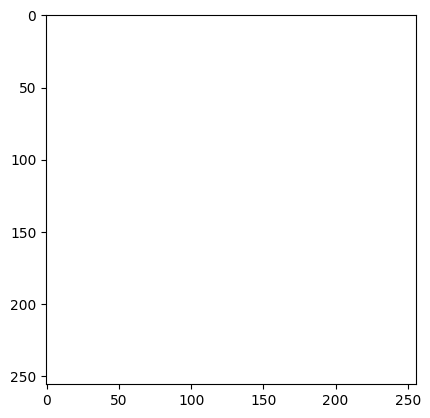

In [28]:
fig = plt.figure()
camera = Camera(fig)  
pred = output_tensor.argmax(0)

for i in range(0, output_tensor.shape[3], 2):  # axial view
    plt.imshow(imgs[0,:,:,i], cmap="bone")
    mask_ = np.ma.masked_where(pred[:,:,i]==0, pred[:,:,i])
    label_mask = np.ma.masked_where(mask[0,:,:,i]==0, mask[0,:,:,i])
    plt.imshow(mask_, alpha=0.1, cmap="autumn")
    # plt.imshow(label_mask, alpha=0.5, cmap="jet")  

    # plt.axis("off")
    camera.snap()  # Store current slice
animation = camera.animate()    



In [29]:
# HTML(animation.to_html5_video())  

from IPython.display import HTML
HTML(animation.to_jshtml())

In [32]:
print(np.unique(mask))

[0. 1.]


In [ ]:
train_losses = []
val_losses = []


# train_losses = [...]
# val_losses = [...]

plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()

plt.show()